In [1]:
from shapely.geometry import Point
import pandas as pd
import geopandas as gpd
import matplotlib.pyplot as plt
import folium
from folium.plugins import MarkerCluster
from folium.plugins import FastMarkerCluster

In [2]:
nyc = gpd.read_file('../data/Borough_Boundaries.geojson')
print(nyc.crs)
nyc.head()

epsg:4326


,boro_code,boro_name,shape_area,shape_leng,geometry
0,4,Queens,3040205594.95,900269.280485,"MULTIPOLYGON (((-73.82645 40.59053, -73.82642 ..."
1,3,Brooklyn,1934167333.21,728477.954082,"MULTIPOLYGON (((-73.86327 40.58388, -73.86381 ..."
2,5,Staten Island,1623631283.36,325924.002076,"MULTIPOLYGON (((-74.05051 40.56642, -74.05047 ..."
3,1,Manhattan,636620785.519,359993.126318,"MULTIPOLYGON (((-74.01093 40.68449, -74.01193 ..."
4,2,Bronx,1187193588.79,463868.599917,"MULTIPOLYGON (((-73.89681 40.79581, -73.89694 ..."


In [3]:
type(nyc)

geopandas.geodataframe.GeoDataFrame

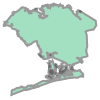

In [4]:
nyc.loc[0, 'geometry']

In [5]:
print(nyc.loc[0, 'geometry'])

MULTIPOLYGON (((-73.82644661516991 40.59052744193831, -73.82642403888464 40.59049483052486, -73.82640914894399 40.59045974688132, -73.82640238825243 40.59042323460854, -73.82640395790071 40.59038637980206, -73.82641381118461 40.59035027874408, -73.82643165499539 40.59031600529457, -73.82645695854175 40.5902845789477, -73.8264889691382 40.59025693450695, -73.8267745715186 40.5900320080855, -73.82681097362916 40.58999305153171, -73.8268542600488 40.58995842799489, -73.82690355436803 40.58992883848113, -73.82695785854278 40.58990488207443, -73.82701607309994 40.58988704380752, -73.82713881899797 40.58985224993937, -73.82725825688735 40.58981130855536, -73.82737385766713 40.58976440102488, -73.82737543424058 40.58978519204887, -73.82737265672866 40.58980590986252, -73.82736559571907 40.58982602790974, -73.82735443066846 40.58984503487772, -73.82733944534036 40.58986244769183, -73.82732102059438 40.58987782379372, -73.8273183991794 40.58988942277339, -73.82731837807653 40.5899011926368, -73

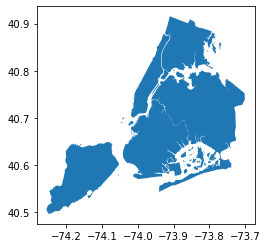

In [6]:
nyc.plot();

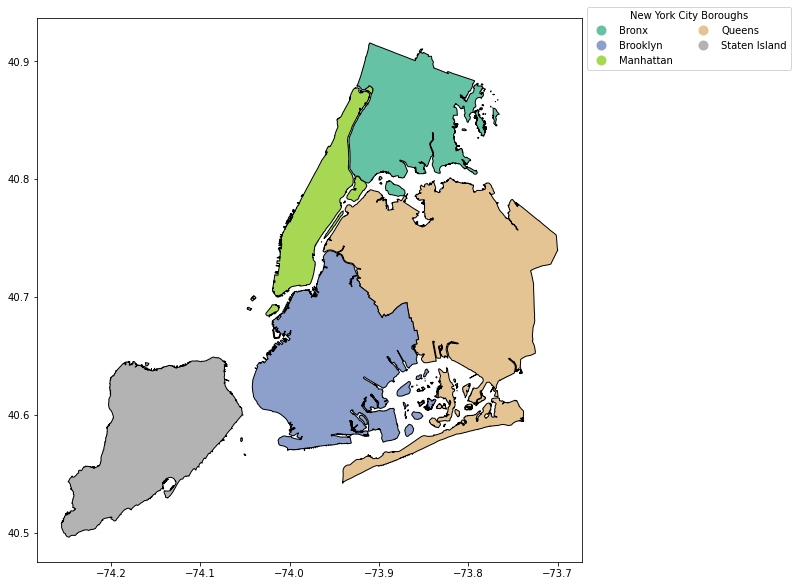

In [7]:
leg_kwds = {'title': 'New York City Boroughs', 'loc': 'upper left', 
            'bbox_to_anchor': (1, 1.03), 'ncol': 2}

nyc.plot(column = 'boro_name', figsize=(10, 10),
              edgecolor = 'black',
              legend = True, legend_kwds = leg_kwds, 
              cmap = 'Set2')
plt.show()

In [8]:
nyc_bus = pd.read_csv('../data/NYC_Bus_Stops.csv')
nyc_bus.head()

,Borough,the_geom,BoroCode,OBJECTID,BoroCD,CounDist,AssemDist,StSenDist,CongDist,SHELTER_ID,NAME,AT_BETWEEN,Latitude,Longitude,FEMAFldz,FEMAFldT,HrcEvac
0,Brooklyn,POINT (-73.9478295701936 40.70680374307532),3,1,301,34,53,18,7,BR0003,MONTROSE AV,LORIMER ST,40.706812,-73.947831,X,AREA OF MINIMAL FLOOD HAZARD,5.0
1,Brooklyn,POINT (-73.9451605700359 40.71908874054852),3,2,301,34,50,18,12,BR0014,GRAHAM AV,HERBERT ST,40.719097,-73.945162,X,AREA OF MINIMAL FLOOD HAZARD,5.0
2,Brooklyn,POINT (-73.9457815717667 40.70296774339004),3,3,301,34,53,18,7,BR0026,BROADWAY,LEONARD ST,40.702976,-73.945783,X,AREA OF MINIMAL FLOOD HAZARD,4.0
3,Brooklyn,POINT (-73.94083457184558 40.720186740021475),3,4,301,34,50,18,12,BR0028,KINGSLAND AV,HERBERT ST,40.720195,-73.940836,X,AREA OF MINIMAL FLOOD HAZARD,6.0
4,Brooklyn,POINT (-73.96979356454533 40.693431746294216),3,5,302,35,50,25,8,BR0040,VANDERBILT AV,MYRTLE AV,40.693440,-73.969795,X,AREA OF MINIMAL FLOOD HAZARD,NaN


In [9]:
nyc_bus = nyc_bus[['Borough','NAME','Latitude','Longitude']]
nyc_bus.head()

,Borough,NAME,Latitude,Longitude
0,Brooklyn,MONTROSE AV,40.706812,-73.947831
1,Brooklyn,GRAHAM AV,40.719097,-73.945162
2,Brooklyn,BROADWAY,40.702976,-73.945783
3,Brooklyn,KINGSLAND AV,40.720195,-73.940836
4,Brooklyn,VANDERBILT AV,40.693440,-73.969795


In [10]:
nyc_bus.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3428 entries, 0 to 3427
Data columns (total 4 columns):
 #   Column     Non-Null Count  Dtype  
---  ------     --------------  -----  
 0   Borough    3428 non-null   object 
 1   NAME       3428 non-null   object 
 2   Latitude   3428 non-null   float64
 3   Longitude  3428 non-null   float64
dtypes: float64(2), object(2)
memory usage: 107.2+ KB


In [11]:
nyc_bus['geometry'] = nyc_bus.apply(lambda x: Point((x.Longitude, 
                                                         x.Latitude)), 
                                        axis=1)
nyc_bus.head(3)

,Borough,NAME,Latitude,Longitude,geometry
0,Brooklyn,MONTROSE AV,40.706812,-73.947831,POINT (-73.94783099999999 40.706812)
1,Brooklyn,GRAHAM AV,40.719097,-73.945162,POINT (-73.945162 40.719097)
2,Brooklyn,BROADWAY,40.702976,-73.945783,POINT (-73.94578300000001 40.702976)


In [12]:
nycbus_geo = gpd.GeoDataFrame(nyc_bus, 
                           crs = nyc.crs, 
                           geometry = nyc_bus['geometry'])

In [13]:
type(nycbus_geo)

geopandas.geodataframe.GeoDataFrame

In [14]:
nyc.crs

<Geographic 2D CRS: EPSG:4326>
Name: WGS 84
Axis Info [ellipsoidal]:
- Lat[north]: Geodetic latitude (degree)
- Lon[east]: Geodetic longitude (degree)
Area of Use:
- name: World
- bounds: (-180.0, -90.0, 180.0, 90.0)
Datum: World Geodetic System 1984
- Ellipsoid: WGS 84
- Prime Meridian: Greenwich

In [15]:
nyc_area_center = ['40.71','-74.00']
print(nyc_area_center)

['40.71', '-74.00']


In [16]:
map_nyc = folium.Map(location = nyc_area_center, zoom_start = 12)
map_nyc

In [17]:
i = 0
for row_index, row_values in nycbus_geo.iterrows():
    if i <3: 
       print('index is', row_index)
       print('values are:')
       print(' ')
       print(row_values)
       print('------------------------- ')
       i+=1

index is 0
values are:
 
Borough                                  Brooklyn
NAME                                  MONTROSE AV
Latitude                                40.706812
Longitude                              -73.947831
geometry     POINT (-73.94783099999999 40.706812)
Name: 0, dtype: object
------------------------- 
index is 1
values are:
 
Borough                          Brooklyn
NAME                            GRAHAM AV
Latitude                        40.719097
Longitude                      -73.945162
geometry     POINT (-73.945162 40.719097)
Name: 1, dtype: object
------------------------- 
index is 2
values are:
 
Borough                                  Brooklyn
NAME                                     BROADWAY
Latitude                                40.702976
Longitude                              -73.945783
geometry     POINT (-73.94578300000001 40.702976)
Name: 2, dtype: object
------------------------- 


In [18]:
map_nyc = folium.Map(location =  nyc_area_center, zoom_start = 12)

for row_index, row_values in nyc_bus.iterrows():
    loc = [row_values['Latitude'], row_values['Longitude']]
    pop = str(row_values['NAME'])
    icon=folium.Icon(color="blue",icon="bus", prefix='fa')
    marker = folium.Marker(
    location = loc, 
    popup = pop, icon = icon)
    marker.add_to(map_nyc)
    
map_nyc.save('../maps/nyc_bus.html')

map_nyc

In [19]:
cluster_map_nyc = folium.Map(location =  nyc_area_center, zoom_start = 12)

marker_cluster = MarkerCluster().add_to(cluster_map_nyc)

for row_index, row_values in nyc_bus.iterrows():
    loc = [row_values['Latitude'], row_values['Longitude']]
    pop = str(row_values['NAME'])
    icon=folium.Icon(color="blue",icon="bus", prefix='fa')
    marker = folium.Marker(
    location = loc, 
    popup = pop, icon = icon)
    marker.add_to(marker_cluster)
    
cluster_map_nyc.save('../maps/nyc_bus_cluster.html')

cluster_map_nyc